## Assignment-3: Predicting whether the income is <=50k based on the census dataset
### Group-108: Praneeth, Jeneive and Abilash

#### Importing libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from scipy import stats

#### Reading the main and test data set

In [2]:
col_names = ['age', 'workclass', 'fnlwgt', 'education', 'education-num',
             'marital-status', 'occupation', 'relationship', 'race', 'sex',
             'capital-gain', 'capital-loss', 'hours-per-week', 'native-country', 'income']
# The main data
census_data = pd.read_csv("data.csv", header=0, names=col_names)

census_data_test = pd.read_csv("test.csv", header=0, names=col_names)

In [3]:
census_data.info() # Info for the main dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32560 entries, 0 to 32559
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32560 non-null  int64 
 1   workclass       32560 non-null  object
 2   fnlwgt          32560 non-null  int64 
 3   education       32560 non-null  object
 4   education-num   32560 non-null  int64 
 5   marital-status  32560 non-null  object
 6   occupation      32560 non-null  object
 7   relationship    32560 non-null  object
 8   race            32560 non-null  object
 9   sex             32560 non-null  object
 10  capital-gain    32560 non-null  int64 
 11  capital-loss    32560 non-null  int64 
 12  hours-per-week  32560 non-null  int64 
 13  native-country  32560 non-null  object
 14  income          32560 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


In [4]:
census_data_test.info() # Info for the test dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16280 entries, 0 to 16279
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             16280 non-null  int64 
 1   workclass       16280 non-null  object
 2   fnlwgt          16280 non-null  int64 
 3   education       16280 non-null  object
 4   education-num   16280 non-null  int64 
 5   marital-status  16280 non-null  object
 6   occupation      16280 non-null  object
 7   relationship    16280 non-null  object
 8   race            16280 non-null  object
 9   sex             16280 non-null  object
 10  capital-gain    16280 non-null  int64 
 11  capital-loss    16280 non-null  int64 
 12  hours-per-week  16280 non-null  int64 
 13  native-country  16280 non-null  object
 14  income          16280 non-null  object
dtypes: int64(6), object(9)
memory usage: 1.9+ MB


In [5]:
census_data.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K


In [6]:
census_data_test.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
1,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
2,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
3,18,?,103497,Some-college,10,Never-married,?,Own-child,White,Female,0,0,30,United-States,<=50K
4,34,Private,198693,10th,6,Never-married,Other-service,Not-in-family,White,Male,0,0,30,United-States,<=50K


In [7]:
census_data.shape

(32560, 15)

In [8]:
census_data_test.shape

(16280, 15)

In [9]:
census_data.describe()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week
count,32560.000000,3.256000e+04,32560.000000,32560.000000,32560.000000,32560.000000
mean,38.581634,1.897818e+05,10.080590,1077.615172,87.306511,40.437469
std,13.640642,1.055498e+05,2.572709,7385.402999,402.966116,12.347618
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178315e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783630e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370545e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


In [10]:
census_data.dtypes

age                int64
workclass         object
fnlwgt             int64
education         object
education-num      int64
marital-status    object
occupation        object
relationship      object
race              object
sex               object
capital-gain       int64
capital-loss       int64
hours-per-week     int64
native-country    object
income            object
dtype: object

In [11]:
# Removing extra spaces from the strings
data = census_data.select_dtypes(exclude=['int64'])
data_test = census_data_test.select_dtypes(exclude=['int64'])
for col in data:
    census_data[col] = census_data[col].str.strip()
    census_data_test[col] = census_data_test[col].str.strip()

### Data exploration and visualization

In [12]:
# Printing the percent of the column data per unique value
category_columns = census_data.dtypes[census_data.dtypes == 'object']
category_column_list = category_columns.index
total_rows = census_data.shape[0]
for col in category_column_list:
    print(f"--------------------{col.title()}-------------------------")
    total = census_data[col].value_counts()
    percent = total / total_rows * 100
    temp_data_frame = pd.concat([total, percent], keys = ['total','percent'], axis = 1)
    print(temp_data_frame, "\n")

--------------------Workclass-------------------------
                  total    percent
Private           22696  69.705160
Self-emp-not-inc   2541   7.804054
Local-gov          2093   6.428133
?                  1836   5.638821
State-gov          1297   3.983415
Self-emp-inc       1116   3.427518
Federal-gov         960   2.948403
Without-pay          14   0.042998
Never-worked          7   0.021499 

--------------------Education-------------------------
              total    percent
HS-grad       10501  32.251229
Some-college   7291  22.392506
Bachelors      5354  16.443489
Masters        1723   5.291769
Assoc-voc      1382   4.244472
11th           1175   3.608722
Assoc-acdm     1067   3.277027
10th            933   2.865479
7th-8th         646   1.984029
Prof-school     576   1.769042
9th             514   1.578624
12th            433   1.329853
Doctorate       413   1.268428
5th-6th         333   1.022727
1st-4th         168   0.515971
Preschool        51   0.156634 

---------

#### Observations from the above data:-

1. We have unknowns ('?') in the following columns :-
         1.  __Native-Country__ - 583 unknowns (?)
         2. __Occupation__ - 1843 unknowns (?)
         3. __Work-class__ - 1836 unknowns (?)
2. 9th, 10th, 11th, 12th comes under HighSchool Grad but it has mentioned separately
   Create Elementary object for 1st-4th, 5th-6th, 7th-8th
3. Married-civ-spouse,Married-spouse-absent,Married-AF-spouse comes under category Married
   Divorced, separated again comes under category separate
4. Self-emp-not-inc, Self-emp-inc comes under category self employed
   Local-gov,State-gov,Federal-gov comes under category goverment emloyees

### Data cleaning and Feature removal

In [13]:
# Number of missing values in test data per column
edit_cols = ['native-country', 'occupation', 'workclass']
for col in edit_cols:
    print(f"MainDataset: ? in {col}: {census_data_test[(census_data_test[col] == '?')].any().sum()}")
    print(f"TestDataSet: ? in {col}: {census_data[(census_data[col] == '?')].any().sum()}")

MainDataset: ? in native-country: 15
TestDataSet: ? in native-country: 15
MainDataset: ? in occupation: 15
TestDataSet: ? in occupation: 15
MainDataset: ? in workclass: 15
TestDataSet: ? in workclass: 15


In [14]:
# Replace ? with Unknown
for col in edit_cols:
    census_data.loc[census_data[col] == '?', col] = 'unknown'
    census_data_test.loc[census_data_test[col] == '?', col] = 'unknown'


In [15]:
census_data['workclass'].value_counts()

Private             22696
Self-emp-not-inc     2541
Local-gov            2093
unknown              1836
State-gov            1297
Self-emp-inc         1116
Federal-gov           960
Without-pay            14
Never-worked            7
Name: workclass, dtype: int64

In [16]:
for col in edit_cols:
    print(f"? in {col}: {census_data[(census_data[col] == '?')].any().sum()}")

? in native-country: 0
? in occupation: 0
? in workclass: 0


In [17]:
married= ['Married-spouse-absent', 'Married-civ-spouse', 'Married-AF-spouse']
separated = ['Separated', 'Divorced']

# replace elements in list.
census_data['marital-status'].replace(to_replace = married, value = 'Married', inplace = True)
census_data['marital-status'].replace(to_replace = separated, value = 'Separated', inplace = True)
census_data_test['marital-status'].replace(to_replace = married, value = 'Married', inplace = True)
census_data_test['marital-status'].replace(to_replace = separated, value = 'Separated', inplace = True)

census_data['marital-status'].value_counts()




Married          15417
Never-married    10682
Separated         5468
Widowed            993
Name: marital-status, dtype: int64

In [18]:
# replace elements in list for the test dataset.
census_data_test['marital-status'].value_counts()

Married          7627
Never-married    5433
Separated        2695
Widowed           525
Name: marital-status, dtype: int64

In [19]:
self_employed = ['Self-emp-not-inc','Self-emp-inc']
govt_employees = ['Local-gov','State-gov','Federal-gov']

# replace elements in list.
census_data['workclass'].replace(to_replace = self_employed, value = 'Self_employed', inplace = True)
census_data['workclass'].replace(to_replace = govt_employees, value = 'Govt_employees', inplace = True)
# replace elements in list for the testdata
census_data_test['workclass'].replace(to_replace = self_employed, value = 'Self_employed', inplace = True)
census_data_test['workclass'].replace(to_replace = govt_employees, value = 'Govt_employees', inplace = True)

census_data['workclass'].value_counts()

Private           22696
Govt_employees     4350
Self_employed      3657
unknown            1836
Without-pay          14
Never-worked          7
Name: workclass, dtype: int64

In [20]:
hs_grad = ['HS-grad','11th','10th','9th','12th']
elementary = ['1st-4th','5th-6th','7th-8th']

# replace elements in list.
census_data['education'].replace(to_replace = hs_grad, value = 'HS-grad', inplace = True)
census_data['education'].replace(to_replace = elementary, value = 'elementary_school', inplace = True)
census_data_test['education'].replace(to_replace = hs_grad, value = 'HS-grad', inplace = True)
census_data_test['education'].replace(to_replace = elementary, value = 'elementary_school', inplace = True)
census_data['education'].value_counts()

HS-grad              13556
Some-college          7291
Bachelors             5354
Masters               1723
Assoc-voc             1382
elementary_school     1147
Assoc-acdm            1067
Prof-school            576
Doctorate              413
Preschool               51
Name: education, dtype: int64

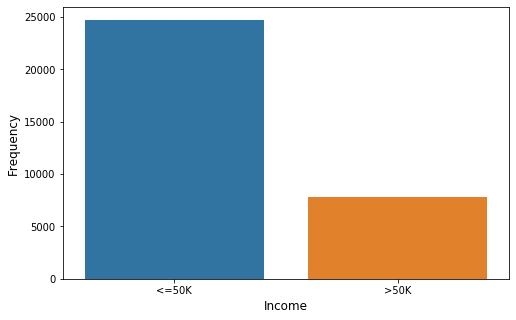

In [21]:
plt.figure(figsize =(8,5));
sns.countplot(x = 'income', data = census_data);
plt.xlabel("Income", fontsize = 12);
plt.ylabel("Frequency", fontsize = 12);

We have a 25000 people with income <= 50K and rest with >50k income.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fb245670d90>,
      dtype=object)

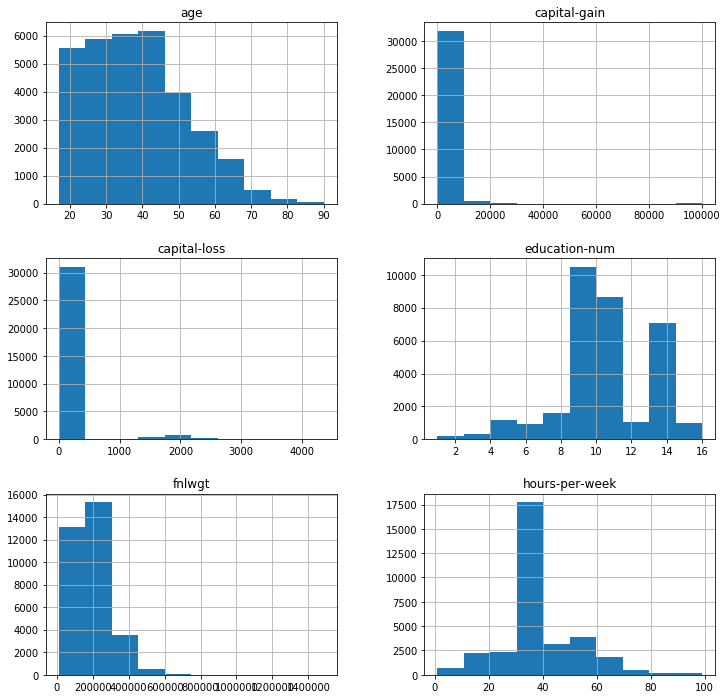

In [22]:
census_data.hist(figsize=(12,12))

1. age: In our dataset People from age group of 18 to 50 can be observed.
2. hours per week: Generally people can be seen working for 30 hours to 40 hours per week.
3. education: people above 8th grade are more in our dataset.
4. Our dataset is highly skewed and we should consider scaling it for better performance of our models.

In [23]:
# To see what is happening with capital gain

count_greater_than_0 = census_data.loc[census_data['capital-gain'] > 0, :].shape[0]
total_count = census_data.shape[0]

percent_of_capital_gain_greater_than_0 = count_greater_than_0 / total_count * 100
print(f"Percentage of data having capital gain > 0 are: {percent_of_capital_gain_greater_than_0}%")

Percentage of data having capital gain > 0 are: 8.326167076167076%


So, what this means is that the rest 92 % are having capital gain = 0

In [24]:
count_greater_than_0 = census_data.loc[census_data['capital-loss'] > 0, :].shape[0]
percent_of_capital_loss_greater_than_0 = count_greater_than_0 / total_count * 100
print(f"Percentage of data having capital loss > 0 are: {percent_of_capital_loss_greater_than_0}%")

Percentage of data having capital loss > 0 are: 4.6652334152334145%


In [25]:
capital_gain_0 = census_data[census_data['capital-loss'] > 0].loc[:,['capital-loss','capital-gain']].sample(10)
capital_loss_0 = census_data[census_data['capital-gain'] > 0].loc[:,['capital-loss','capital-gain']].sample(5)
print(capital_gain_0.head())
print(capital_loss_0.head())

       capital-loss  capital-gain
23053          3683             0
19362          1977             0
7869           1902             0
22031          1669             0
13234          1721             0
       capital-loss  capital-gain
26361             0          2597
1591              0          1055
27141             0          7688
10699             0         20051
18905             0         15024


So, this means that if capital-gain is zero, capital-loss can be zero or above zero and vice versa.

In [26]:
count_equal_to_0 = census_data.loc[(census_data['capital-loss'] == 0) & (census_data['capital-gain'] == 0), :].shape[0]
percent_for_0_0 = count_equal_to_0 / total_count * 100
print(f"Percentage of data having capital loss == 0 are: {percent_for_0_0}%")

Percentage of data having capital loss == 0 are: 87.0085995085995%


So, this is highly skewed data and outliers can be taken care of

### Outlier analysis to see whether there are any outliers

90    43
81    20
82    12
84    10
83     6
88     3
85     3
87     1
86     1
Name: age, dtype: int64

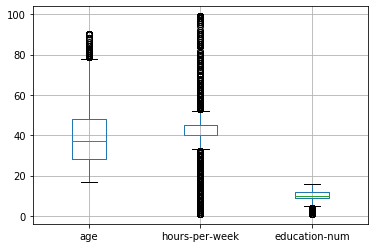

In [27]:
#census_data['capital-gain'].plot.box(figsize=(10, 10))
census_data.boxplot(column=['age', 'hours-per-week', 'education-num'])
census_data.loc()
census_data.loc[census_data['age'] > 80, 'age'].value_counts()

From the above box plots there are some outliers in the age where people are having age > 80.

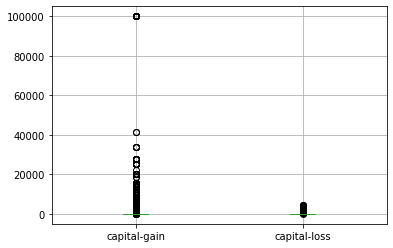

In [28]:
census_data.boxplot(column=['capital-gain', 'capital-loss'])

#### From the box plot we can clearly see that for capital-gain there is an outlier of value 99999 which is way ahead of the the third quartile (Q3).

In [29]:
no_of_capital_gain = census_data.loc[census_data['capital-gain'] == 99999,:].shape
no_of_capital_gain_income_gt_50k = census_data.loc[(census_data['capital-gain'] == 99999) & (census_data['income'] == '>50K'),:].shape
print(f"Number of observations having capital gain of 99999: {no_of_capital_gain[0]}")

print(f"Number of observations having capital gain of 99999 and income > 50K: {no_of_capital_gain_income_gt_50k[0]}")


Number of observations having capital gain of 99999: 159
Number of observations having capital gain of 99999 and income > 50K: 159


From this we can understand that people with capital gain of 99999 has always income > 50k

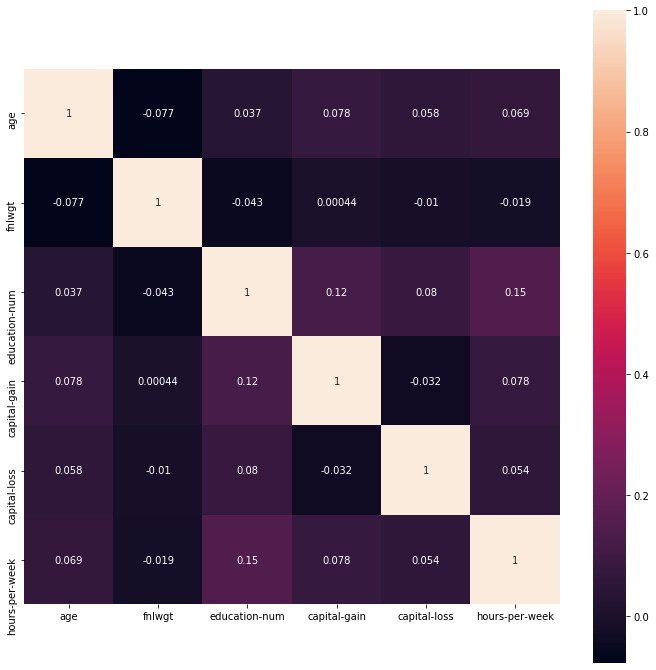

In [30]:
corrmat = census_data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(12,12))
#plot heat map
g = sns.heatmap(census_data[top_corr_features].corr(),annot=True, square=True)

#### Highly correlated attributes:-
1. education-num and capital-gain
2. age and hours-per-week
3. age and capital-loss, age and capital-gain

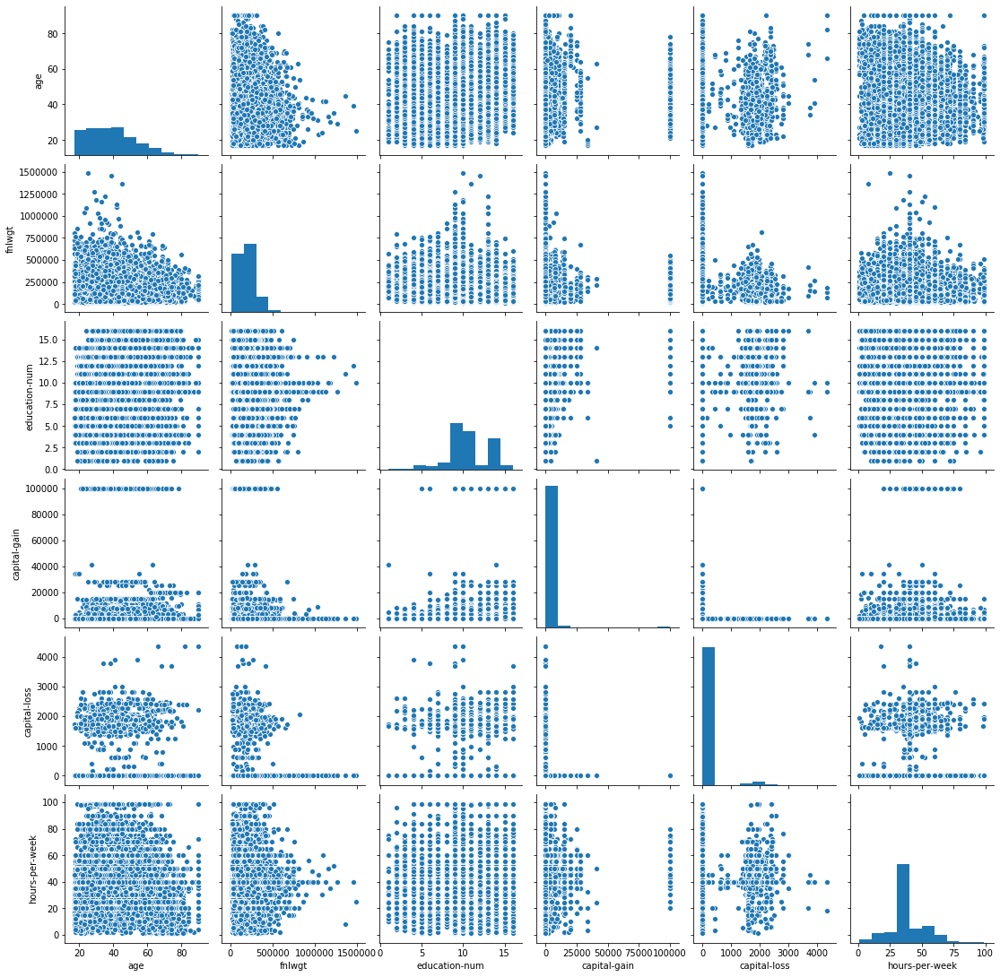

In [31]:
d_data = census_data.select_dtypes(exclude=['object'])
sns.pairplot(census_data, diag_kind = 'hist')

From the above plot, and based on the correlation if we see age and capital-gain we clearly see 99999 as an outlier for any age and age 90 doesn't follow any pattern.

In [32]:
cols = ['workclass','occupation', 'income', 'hours-per-week']
for col in cols:
    print(f"{col}:\n{census_data.loc[census_data['age'] == 90, :][col].value_counts()}\n")

workclass:
Private           28
unknown            7
Govt_employees     5
Self_employed      3
Name: workclass, dtype: int64

occupation:
Exec-managerial      8
unknown              7
Other-service        6
Prof-specialty       5
Adm-clerical         4
Craft-repair         3
Sales                3
Machine-op-inspct    3
Farming-fishing      1
Transport-moving     1
Protective-serv      1
Handlers-cleaners    1
Name: occupation, dtype: int64

income:
<=50K    35
>50K      8
Name: income, dtype: int64

hours-per-week:
40    20
50     3
10     3
35     2
15     2
20     2
60     1
24     1
72     1
12     1
30     1
25     1
99     1
37     1
45     1
55     1
4      1
Name: hours-per-week, dtype: int64



At age 90, people can't work in government offices as you can see the number is less. Also the maximum working hours you can see is 40 hrs.

#### Outliers Summary

1. Capital gain of 99999 doesn't follow any pattern and from graph above it clearly distinguishes to be an outlier.
2. Our dataset has people with age 90 and working for 40 hours per week in goverment or private sectors which is again    unreasonable.
3. Few people working for 99 hours per week.

#### Feature Removal

1. Education num and education are giving similar information
2. Relationship and marital status imply similar information.Hence keeping only one of the two.

### Data Normalization and redundant feature removal

In [33]:
print(f"Number of columns before deleting: {census_data.shape[1]}")

del_cols = ['relationship','education-num']
census_data.drop(labels = del_cols, axis = 1,inplace = True)
census_data_test.drop(labels = del_cols, axis = 1,inplace = True) # Doing the same for test dataset
print(f"Number of columns after deleting: {census_data.shape[1]}")


Number of columns before deleting: 15
Number of columns after deleting: 13


In [34]:
print("Number of observation before removing:",census_data.shape)
index_age = census_data[census_data['age'] == 90].index
census_data.drop(labels = index_age,axis = 0,inplace =True)

# Doing the same for the test data
index_age_test = census_data_test[census_data_test['age'] == 90].index
census_data_test.drop(labels = index_age_test,axis = 0,inplace =True)
print("Number of observation after removing:",census_data.shape)

Number of observation before removing: (32560, 13)
Number of observation after removing: (32517, 13)


In [35]:
print("Number of observation before removing:",census_data.shape)
index_gain = census_data[census_data['capital-gain'] == 99999].index
census_data.drop(labels = index_gain,axis = 0,inplace =True)

# Doing the same for the test dataset
index_gain_test = census_data_test[census_data_test['capital-gain'] == 99999].index
census_data_test.drop(labels = index_gain_test,axis = 0,inplace =True)
print("Number of observation after removing:",census_data.shape)

Number of observation before removing: (32517, 13)
Number of observation after removing: (32358, 13)


In [36]:
census_data.head(3)

,age,workclass,fnlwgt,education,marital-status,occupation,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,50,Self_employed,83311,Bachelors,Married,Exec-managerial,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,Separated,Handlers-cleaners,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,HS-grad,Married,Handlers-cleaners,Black,Male,0,0,40,United-States,<=50K


In [37]:
numeric_cols = list(census_data.select_dtypes(exclude=['object']).keys())
print(numeric_cols)

['age', 'fnlwgt', 'capital-gain', 'capital-loss', 'hours-per-week']


In [38]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
census_data[numeric_cols] = scaler.fit_transform(census_data[numeric_cols])
census_data.head(3)

,age,workclass,fnlwgt,education,marital-status,occupation,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,0.464789,Self_employed,0.048238,Bachelors,Married,Exec-managerial,White,Male,0.0,0.0,0.122449,United-States,<=50K
1,0.295775,Private,0.138113,HS-grad,Separated,Handlers-cleaners,White,Male,0.0,0.0,0.397959,United-States,<=50K
2,0.507042,Private,0.151068,HS-grad,Married,Handlers-cleaners,Black,Male,0.0,0.0,0.397959,United-States,<=50K


In [39]:
census_data_test[numeric_cols] = scaler.fit_transform(census_data_test[numeric_cols])
census_data_test.head(3)

,age,workclass,fnlwgt,education,marital-status,occupation,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,0.291667,Private,0.051677,HS-grad,Married,Farming-fishing,White,Male,0.000000,0.0,0.500000,United-States,<=50K
1,0.152778,Govt_employees,0.219011,Assoc-acdm,Married,Protective-serv,White,Male,0.000000,0.0,0.397959,United-States,>50K
2,0.375000,Private,0.099418,Some-college,Married,Machine-op-inspct,Black,Male,0.186105,0.0,0.397959,United-States,>50K


### Training the model and Decision Tree ML algo

In [40]:
feature_cols = ['age', 'workclass', 'fnlwgt', 'education','marital-status',
                'occupation','race', 'sex', 'capital-gain', 'capital-loss', 
                'hours-per-week', 'native-country']
X = census_data[feature_cols]
y = census_data.income

In [41]:
# https://stackoverflow.com/questions/38108832/passing-categorical-data-to-sklearn-decision-tree
X = pd.get_dummies(X, drop_first=True) # To hot encode the categorical columns
X.head(3)

,age,fnlwgt,capital-gain,capital-loss,hours-per-week,workclass_Never-worked,workclass_Private,workclass_Self_employed,workclass_Without-pay,workclass_unknown,...,native-country_Puerto-Rico,native-country_Scotland,native-country_South,native-country_Taiwan,native-country_Thailand,native-country_Trinadad&Tobago,native-country_United-States,native-country_Vietnam,native-country_Yugoslavia,native-country_unknown
0,0.464789,0.048238,0.0,0.0,0.122449,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
1,0.295775,0.138113,0.0,0.0,0.397959,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2,0.507042,0.151068,0.0,0.0,0.397959,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0


In [42]:
# Hot encoding for the test dataset
TEST_DATASET_FINAL_INCOME_TEST_COL = census_data_test.income
TEST_DATASET_FOR_ML = census_data_test[feature_cols]
TEST_DATASET_FOR_ML = pd.get_dummies(TEST_DATASET_FOR_ML, drop_first=True)
TEST_DATASET_FOR_ML.head(3)

,age,fnlwgt,capital-gain,capital-loss,hours-per-week,workclass_Never-worked,workclass_Private,workclass_Self_employed,workclass_Without-pay,workclass_unknown,...,native-country_Puerto-Rico,native-country_Scotland,native-country_South,native-country_Taiwan,native-country_Thailand,native-country_Trinadad&Tobago,native-country_United-States,native-country_Vietnam,native-country_Yugoslavia,native-country_unknown
0,0.291667,0.051677,0.000000,0.0,0.500000,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0
1,0.152778,0.219011,0.000000,0.0,0.397959,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2,0.375000,0.099418,0.186105,0.0,0.397959,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0


In [43]:
# Added the missing column
size_test = TEST_DATASET_FOR_ML.shape[0]
TEST_DATASET_FOR_ML['native-country_Holand-Netherlands'] = np.zeros(size_test, dtype='int64')

In [44]:
TEST_DATASET_FOR_ML.head(3)

,age,fnlwgt,capital-gain,capital-loss,hours-per-week,workclass_Never-worked,workclass_Private,workclass_Self_employed,workclass_Without-pay,workclass_unknown,...,native-country_Scotland,native-country_South,native-country_Taiwan,native-country_Thailand,native-country_Trinadad&Tobago,native-country_United-States,native-country_Vietnam,native-country_Yugoslavia,native-country_unknown,native-country_Holand-Netherlands
0,0.291667,0.051677,0.000000,0.0,0.500000,0,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0
1,0.152778,0.219011,0.000000,0.0,0.397959,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,0.375000,0.099418,0.186105,0.0,0.397959,0,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0


In [45]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

In [46]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix

## Running the ML algorithms

In [47]:
def give_accuracy(confusion_matrix):
    TN = confusion_matrix[0,0]
    FP = confusion_matrix[0,1]
    FN = confusion_matrix[1,0]
    TP = confusion_matrix[1,1]
    accuracy_score=(TN+TP) / float(TP+TN+FP+FN)
    return accuracy_score * 100

### 1.) Using Gini

In [48]:
clf = DecisionTreeClassifier(criterion="gini")
clf = clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)
gini_conf_matrix = confusion_matrix(y_test, y_pred)
print(gini_conf_matrix)
print(classification_report(y_test, y_pred))

[[6413  932]
 [ 876 1487]]
              precision    recall  f1-score   support

       <=50K       0.88      0.87      0.88      7345
        >50K       0.61      0.63      0.62      2363

    accuracy                           0.81      9708
   macro avg       0.75      0.75      0.75      9708
weighted avg       0.82      0.81      0.81      9708



In [49]:
acc_gini_1 = give_accuracy(gini_conf_matrix)
print(f"Accuracy of the decision tree using gini: {acc_gini_1}%")

Accuracy of the decision tree using gini: 81.37618459002884%


##### Predicting output for test.csv

In [50]:
# Predicting the output for the test data set ('test.csv')
y_pred_test = clf.predict(TEST_DATASET_FOR_ML)
acc_gini_test = give_accuracy(confusion_matrix(TEST_DATASET_FINAL_INCOME_TEST_COL, y_pred_test))
print(f"Accuracy of the decision tree using gini for test dataset : {acc_gini_test}%")

Accuracy of the decision tree using gini for test dataset : 80.33121176543287%


In [51]:
## Reducing over fitting (Regularization) - Gini
clf_gini_reg = DecisionTreeClassifier(criterion = 'gini', max_depth = 3, random_state=1)
clf_gini_reg.fit(X_train, y_train)
y_pred = clf_gini_reg.predict(X_test)
gini_conf_matrix_3 = confusion_matrix(y_test, y_pred)
give_accuracy(gini_conf_matrix)

81.37618459002884

In [52]:
from IPython.display import Image  
#import pydotplus as pydot
from sklearn import tree
from os import system
# visualize after the Regularization
Credit_Tree_FileR = open('incomeginiR.dot','w')
dot_data = tree.export_graphviz(clf, out_file=Credit_Tree_FileR)
Credit_Tree_FileR.close()


retCode = system("dot -Tpng incomeginiR.dot -o incomeginiR.png")
if(retCode>0):
    print("system command returning error: "+str(retCode))
else:
    print("Decision tree visualization")
    display(Image("incomeginiR.png"))

# NOTE:- Double click on the below image to see the tree

Decision tree visualization


### 2.) Using Entropy

In [53]:
clf_entropy = DecisionTreeClassifier(criterion="entropy")
clf_entropy = clf_entropy.fit(X_train, y_train)
y_pred = clf_entropy.predict(X_test)
entropy_conf_matrix = confusion_matrix(y_test, y_pred)
print(entropy_conf_matrix)
print(classification_report(y_test, y_pred))

[[6434  911]
 [ 886 1477]]
              precision    recall  f1-score   support

       <=50K       0.88      0.88      0.88      7345
        >50K       0.62      0.63      0.62      2363

    accuracy                           0.81      9708
   macro avg       0.75      0.75      0.75      9708
weighted avg       0.82      0.81      0.82      9708



In [54]:
acc_entropy_1 = give_accuracy(entropy_conf_matrix)
print(f"Accuracy of the decision tree using gini: {acc_entropy_1}%")

Accuracy of the decision tree using gini: 81.48949320148331%


##### Predicting output for test.csv

In [55]:
y_pred_test = clf_entropy.predict(TEST_DATASET_FOR_ML)
acc_entropy_test = give_accuracy(confusion_matrix(TEST_DATASET_FINAL_INCOME_TEST_COL, y_pred_test))
print(f"Accuracy of the decision tree using gini for test dataset : {acc_entropy_test}%")

Accuracy of the decision tree using gini for test dataset : 80.09021813013656%


In [56]:
## Reducing over fitting (Regularization) - Entropy
clf_entropy_reg = DecisionTreeClassifier(criterion = 'entropy', max_depth = 3, random_state=1)
clf_entropy_reg.fit(X_train, y_train)
print(clf_entropy_reg.score(X_train, y_train))
print(clf_entropy_reg.score(X_test, y_test))


0.8045916114790287
0.7970745776679028


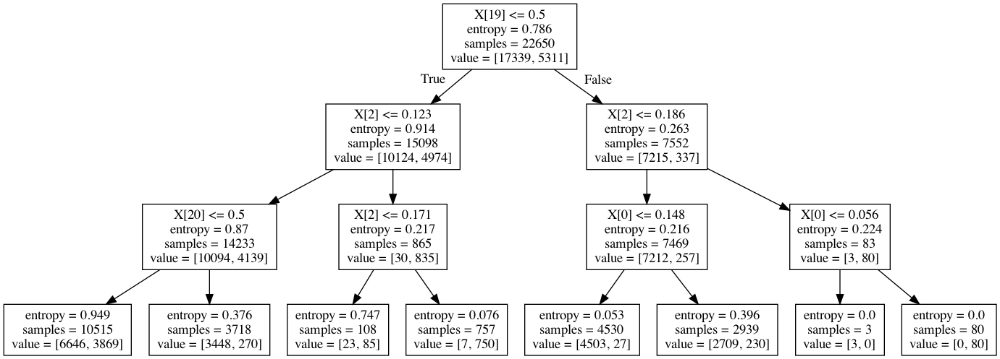

In [57]:
# Now visualize after the Regularization
Credit_Tree_FileR = open('incomeentropyR.dot','w')
dot_data = tree.export_graphviz(clf_entropy_reg, out_file=Credit_Tree_FileR)
Credit_Tree_FileR.close()


retCode = system("dot -Tpng incomeentropyR.dot -o incomeentropyR.png")
if(retCode>0):
    print("system command returning error: "+str(retCode))
else:
    display(Image("incomeentropyR.png"))

In [58]:
Credit_Tree_FileR = open('incomeentropyOld.dot','w')
dot_data = tree.export_graphviz(clf_entropy, out_file=Credit_Tree_FileR)
Credit_Tree_FileR.close()


retCode = system("dot -Tpng incomeentropyOld.dot -o incomeentropyOld.png")
if(retCode>0):
    print("system command returning error: "+str(retCode))
else:
    print("Decision tree visualization")
    display(Image("incomeentropyOld.png"))

Decision tree visualization


### 3.) Logistic regression

In [59]:
# Logistic Model
from sklearn.linear_model import LogisticRegression

log_reg = LogisticRegression(penalty = 'l2', dual = False, tol = 1e-4, fit_intercept = True,solver = 'liblinear')
log_reg.fit(X_train, y_train)

log_reg_pred = log_reg.predict(X_test)

logistic_conf_matrix = confusion_matrix(y_test, log_reg_pred)
print(classification_report(y_test, log_reg_pred))

acc_logistic_1 = give_accuracy(logistic_conf_matrix)
print(f"Accuracy using logistic regresion for the main dataset : {acc_logistic_1}%")

              precision    recall  f1-score   support

       <=50K       0.87      0.93      0.90      7345
        >50K       0.73      0.58      0.65      2363

    accuracy                           0.85      9708
   macro avg       0.80      0.76      0.77      9708
weighted avg       0.84      0.85      0.84      9708

Accuracy using logistic regresion for the main dataset : 84.51792336217552%


In [60]:
y_pred_test = log_reg.predict(TEST_DATASET_FOR_ML)
acc_logist_test = give_accuracy(confusion_matrix(TEST_DATASET_FINAL_INCOME_TEST_COL, y_pred_test))
print(f"Accuracy using logistic regresion for the test dataset : {acc_logist_test}%")

Accuracy using logistic regresion for the test dataset : 84.2612618179571%


### Final comparison of accuracy score for different models used

In [61]:
final_data = {'Accuracy score for main data set':[acc_gini_1, acc_entropy_1, acc_logistic_1],
              'Accuracy score for test data set':[acc_gini_test, acc_entropy_test, acc_logist_test]
             } 
  
df_final = pd.DataFrame(final_data,index = ['Gini', 'Entropy', 'Logistic Regression']) 
df_final

,Accuracy score for main data set,Accuracy score for test data set
Gini,81.376185,80.331212
Entropy,81.489493,80.090218
Logistic Regression,84.517923,84.261262
